# 6. Communities

In this section, we tried to discover relationships and interactions among characters through network representations, with a focus on community detection utilizing the Louvain algorithm. Each book's narrative unfolds a unique web of connections, allowing for a comprehensive examination of the dynamics within the wizarding world. We aim to unravel the mysteries of character affiliations, houses, and blood statuses. Let's cast some data spells and explore the enchanted communities within these networks.

## Louvain-algorithm

The algorithm uncovers meaningful communities, unraveling the nuanced social structures underlying J.K. Rowling's magical realm. This exploration sheds light on how characters form connections and affiliations, enhancing our understanding of the rich storytelling in the Harry Potter universe.

In [258]:
def compute_draw_partition(G, index):
    print('Book', index)
    
    # Keep only the largest connected component
    largest_cc = max(nx.connected_components(G), key=len)
    G = G.subgraph(largest_cc).copy()
    print(G)

    # Compute the best partition for the graph
    partition = community_louvain.best_partition(G)
    num_communities = len(set(partition.values()))
    print("Number of detected communities:", num_communities)

    # Print nodes in each community
    for comm in range(num_communities):
        print(f"Community {comm}: ", [node for node in partition if partition[node] == comm])

    # Calculate the modularity for the detected communities
    modularity = community_louvain.modularity(partition, G)
    print("Modularity of partition:", modularity)

    # Call the drawing function
    draw_graph(G, partition, index)
    return partition

In [259]:
def draw_graph(G, partition, index):
    # Kamada-Kawai layout for node positions
    pos = nx.kamada_kawai_layout(G)

    # Color mapping of communities
    cmap = plt.get_cmap('viridis')
    colors = [cmap(i, alpha=0.7) for i in np.linspace(0, 1, len(set(partition.values())))]

    # Draw nodes
    plt.figure(figsize=(12, 8))  # Set the size of the plot
    for i, comm in enumerate(set(partition.values())):
        list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == comm]
        nx.draw_networkx_nodes(G, pos, list_nodes, node_size=50, node_color=colors[i])

    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color='grey')

    # Draw labels
    nx.draw_networkx_labels(G, pos, font_size=8)

    plt.title(f'Network Visualization of Book {index}')
    plt.show()

Book 1
Graph with 93 nodes and 348 edges
Number of detected communities: 7
Community 0:  ['Hedwig', 'Rubeus Hagrid', 'Vernon Dursley', 'Norbert', 'Dennis', 'Dudley Dursley', 'Gordon', 'Malcolm', 'Lily Potter', 'Petunia Dursley', 'Piers Polkiss', 'Griphook', 'James Potter', 'Marge Dursley', 'Vindictus Viridian', 'Yvonne']
Community 1:  ['Adalbert Waffling', 'Emeric Switch', 'Harry Potter', 'Miranda Goshawk', 'Quentin Trimble', 'Arabella Figg', 'Snowy', 'Tufty', 'Cuthbert Binns', 'Dedalus Diggle', 'Doris Crockford', 'Fat Friar', 'Justin Finch-Fletchley', 'Lavender Brown', 'Mandy Brocklehurst', 'Rolanda Hooch', 'Terence Higgs']
Community 2:  ['Adrian Pucey', 'Alicia Spinnet', 'Angelina Johnson', 'Fred Weasley', 'George Weasley', 'Lee Jordan', 'Marcus Flint', 'Oliver Wood', 'Katie Bell', 'Bertie Bott', 'Cliodna']
Community 3:  ['Alberic Grunnion', 'Albus Dumbledore', 'Circe', 'Hengist of Woodcroft', 'Merlin', 'Paracelsus', 'Cornelius Agrippa', 'Cornelius Fudge']
Community 4:  ['Draco Malfo

/Users/itselios/anaconda3/lib/python3.11/site-packages/networkx/drawing/layout.py:726: RuntimeWarning: divide by zero encountered in divide
  costargs = (np, 1 / (dist_mtx + np.eye(dist_mtx.shape[0]) * 1e-3), meanwt, dim)
/Users/itselios/anaconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


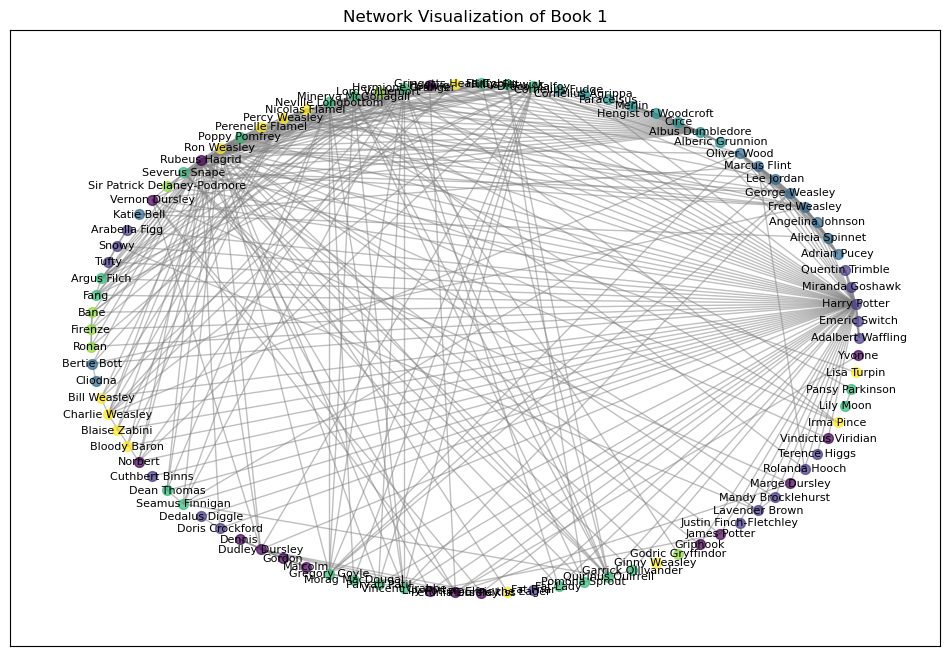

Book 2
Graph with 75 nodes and 341 edges
Number of detected communities: 7
Community 0:  ['Adrian Pucey', 'Harry Potter', 'Nearly-Headless Nick', 'Bloody Baron', 'Hannah Abbott', 'Ernie Macmillan', 'Serpent of Slytherin', 'Veronica Smethley']
Community 1:  ['George Weasley', 'Draco Malfoy', 'Alicia Spinnet', 'Angelina Johnson', 'Fred Weasley', 'Katie Bell', 'Marcus Flint', 'Oliver Wood', 'Molly Weasley', 'Bill Weasley', 'Charlie Weasley', 'Percy Weasley', 'Hermes', 'Lee Jordan', 'Rolanda Hooch']
Community 2:  ['Albus Dumbledore', 'Cornelius Fudge', 'Cuthbert Binns', 'Fang', 'Lord Voldemort', 'Rubeus Hagrid', 'Armando Dippet', 'Marvolo Gaunt', 'Sir Patrick Delaney-Podmore', 'Gringotts Head Goblin', 'Parvati Patil', 'Mosag']
Community 3:  ['Argus Filch', 'Gilderoy Lockhart', 'Justin Finch-Fletchley', 'Minerva McGonagall', 'Poppy Pomfrey', 'Ron Weasley', 'Severus Snape', 'Aragog', 'Myrtle Warren', 'Neville Longbottom', 'Aurora Sinistra', 'Filius Flitwick', 'Celestina Warbeck', 'Seamus Fin

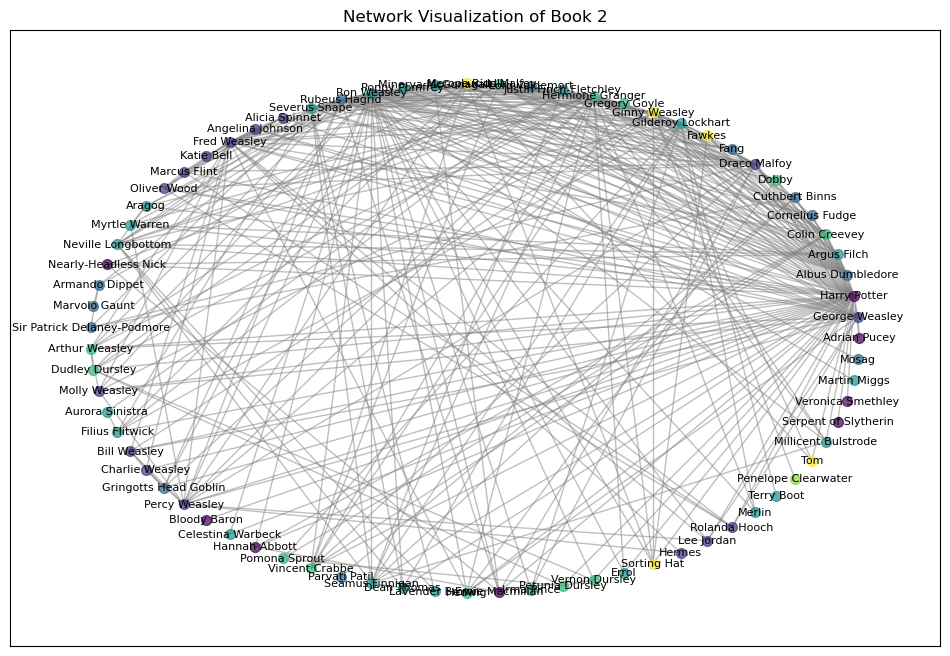

Book 3
Graph with 87 nodes and 420 edges
Number of detected communities: 5
Community 0:  ['Remus Lupin', 'Ron Weasley', 'Sybill Trelawney', 'Lavender Brown', 'Charlie Weasley', 'Crookshanks', 'Neville Longbottom', 'Seamus Finnigan', 'Cuthbert Binns', 'Dean Thomas', 'Parvati Patil', 'Dementor']
Community 1:  ['Albus Dumbledore', 'Argus Filch', 'Buckbeak', 'Cornelius Fudge', 'Draco Malfoy', 'Fat Lady', 'Filius Flitwick', 'James Potter', 'Lord Voldemort', 'Minerva McGonagall', 'Peter Pettigrew', 'Pomona Sprout', 'Poppy Pomfrey', 'Rosmerta', 'Rubeus Hagrid', 'Severus Snape', 'Silvanus Kettleburn', 'Sirius Black', 'Walden Macnair', 'Fat Friar', 'Sir Patrick Delaney-Podmore', 'Hannah Abbott', 'Lily Potter', 'Merlin', 'Norbert', 'Trevor']
Community 2:  ['Fred Weasley', 'Alicia Spinnet', 'Angelina Johnson', 'Cassius Warrington', 'Cedric Diggory', 'George Weasley', 'Katie Bell', 'Lee Jordan', 'Lucian Bole', 'Oliver Wood', 'Rolanda Hooch', 'Graham Montague', 'Cho Chang', 'Marcus Flint', 'Peregri

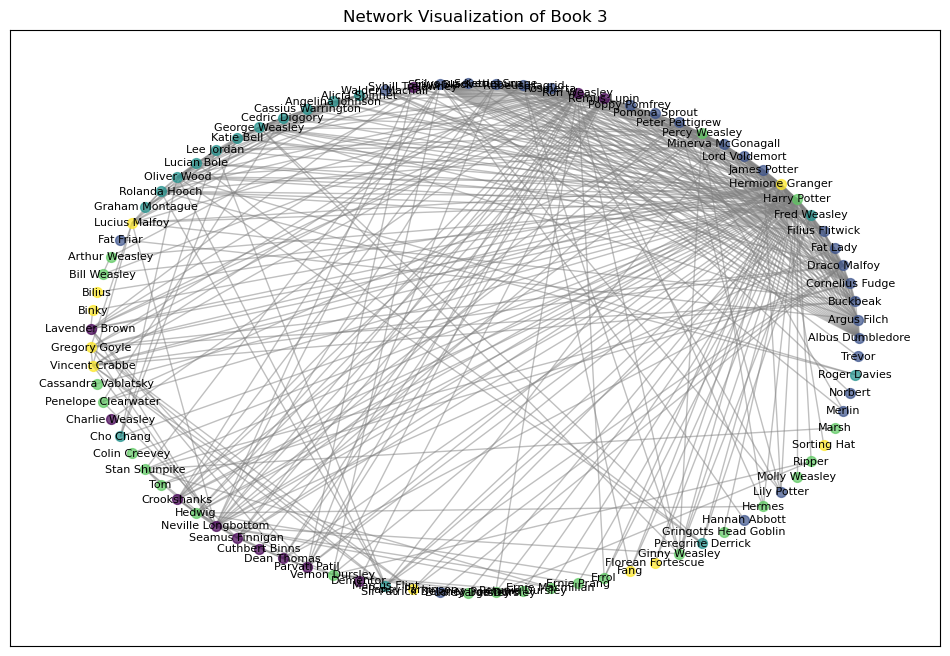

Book 4
Graph with 141 nodes and 718 edges
Number of detected communities: 7
Community 0:  ['Aberforth Dumbledore', 'Fang', 'Igor Karkaroff', 'Rubeus Hagrid', 'Poppy Pomfrey', 'Fleur Delacour', 'Pomona Sprout', 'Olympe Maxime', 'Eleanor Branstone', 'Owen Cauldwell', 'Gabrielle Delacour', 'Roger Davies', 'Poliakoff']
Community 1:  ['Dobby', 'Draco Malfoy', 'Fred Weasley', 'George Weasley', 'Hope Lupin', 'Lee Jordan', 'Vernon Dursley', 'Malcolm', 'Malcolm Baddock', 'Dudley Dursley', 'Petunia Dursley']
Community 2:  ['Harry Potter', 'Frank Bryce', 'Arabella Figg', 'Mundungus Fletcher', 'Remus Lupin', 'Augustus Rookwood', 'Cassius Warrington', 'Cho Chang', 'Ernie Macmillan', 'Stewart Ackerley', 'Colin Creevey', 'Dennis Creevey', 'Dennis', 'Emma Dobbs', 'Sorting Hat', 'Dot', 'Hannah Abbott', 'Justin Finch-Fletchley', 'Nagini', 'James Potter', 'Lily Potter', 'Oliver Wood', 'Wilhelmina Grubbly-Plank']
Community 3:  ['Alastor Moody', 'Hermione Granger', 'Minerva McGonagall', 'Ron Weasley', 'Aur

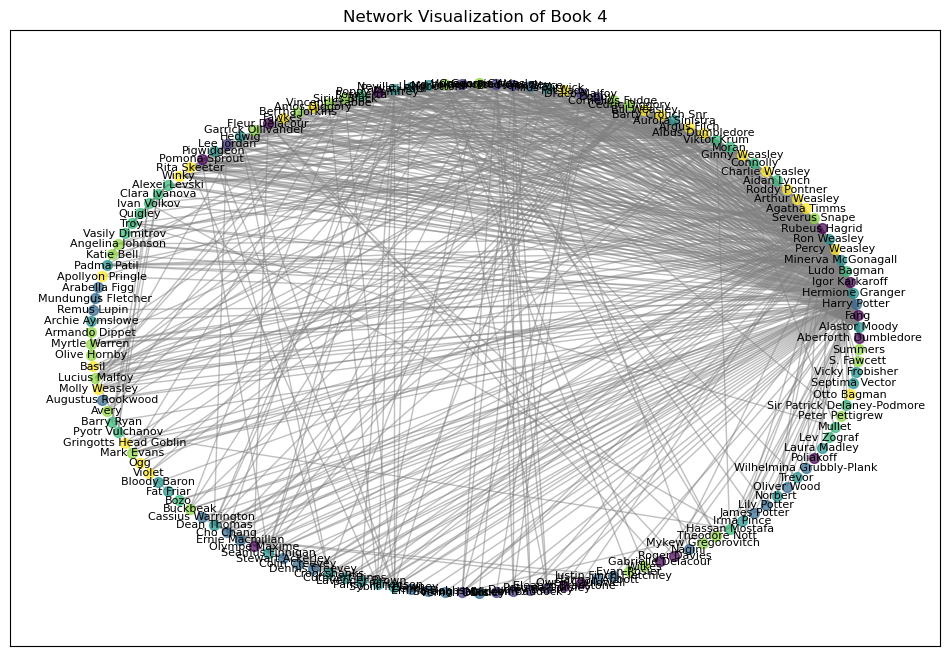

Book 5
Graph with 190 nodes and 1291 edges
Number of detected communities: 5
Community 0:  ['Aberforth Dumbledore', 'Alastor Moody', 'Albus Dumbledore', 'Andromeda Tonks', 'Cornelius Fudge', 'Dorcas Meadowes', 'Draco Malfoy', 'Remus Lupin', 'Rose Zeller', 'Sirius Black', 'Arthur Weasley', 'Benjy Fenwick', 'Dedalus Diggle', 'Hestia Jones', 'Kingsley Shacklebolt', 'Molly Weasley', 'Mundungus Fletcher', 'Vernon Dursley', 'Arabella Figg', 'Armando Dippet', 'Bill Weasley', 'Charlie Weasley', 'Dudley Dursley', 'Florean Fortescue', 'James Potter', 'John Dawlish', 'Kreacher', 'Lucius Malfoy', 'Ludo Bagman', 'Marietta Edgecombe', 'Marlene McKinnon', 'Merlin', 'Nymphadora Tonks', 'Percy Weasley', 'Petunia Dursley', 'Phineas Nigellus Black', 'Severus Snape', 'Tom', 'Augustus Pye', 'Bob', 'Broderick Bode', 'Emmeline Vance', 'Gringotts Head Goblin', 'Ragnok', 'Williamson', 'Doris Purkiss', 'Marge Dursley', 'Mark Evans', 'Gilderoy Lockhart', 'Janus Thickey', 'Lily Potter', 'Will']
Community 1:  ['He

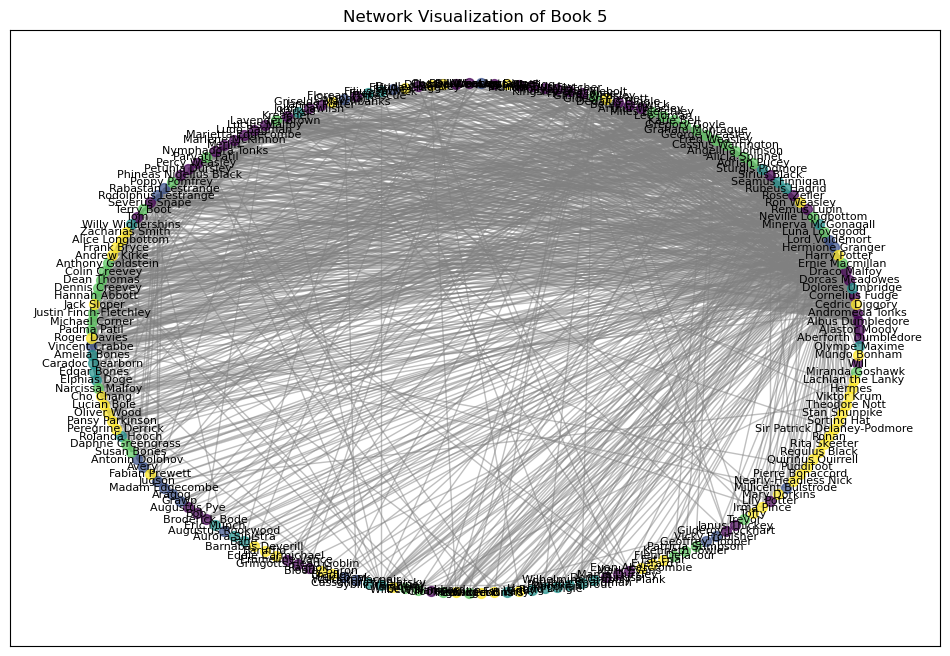

Book 6
Graph with 164 nodes and 826 edges
Number of detected communities: 8
Community 0:  ['Abraxas Malfoy', 'Ginny Weasley', 'Ron Weasley', 'Amycus Carrow', 'Cormac McLaggen', 'Hedwig', 'Hermione Granger', 'Katie Bell', 'Madam Edgecombe', 'Parvati Patil', 'Seamus Finnigan', 'Irma Pince', 'Arnold Peasegood', 'Crookshanks', 'Pigwidgeon', 'Gabrielle Delacour', 'Garrick Ollivander', 'Melinda Bobbin', 'Cho Chang', 'Colin Creevey', 'Grawp', 'Gwenog Jones', 'Lavender Brown', 'Dean Thomas', 'Demelza Robins', 'Romilda Vane', 'Fat Lady', 'Viktor Krum', 'Firenze', 'Michael Corner', 'Septima Vector', 'Montgomery', 'Wilkie Twycross']
Community 1:  ['Blaise Zabini', 'Severus Snape', 'Argus Filch', 'Buckbeak', 'Draco Malfoy', 'Fang', 'Fenrir Greyback', 'Gibbon', 'James Potter', 'Lucius Malfoy', 'Mark Evans', 'Neville Longbottom', 'Alecto Carrow', 'Vincent Crabbe', 'Avery', 'Corban Yaxley', 'Narcissa Malfoy', 'Barnabas Deverill', 'Gregory Goyle', 'Pansy Parkinson', 'Luna Lovegood', 'Ernie Macmillan',

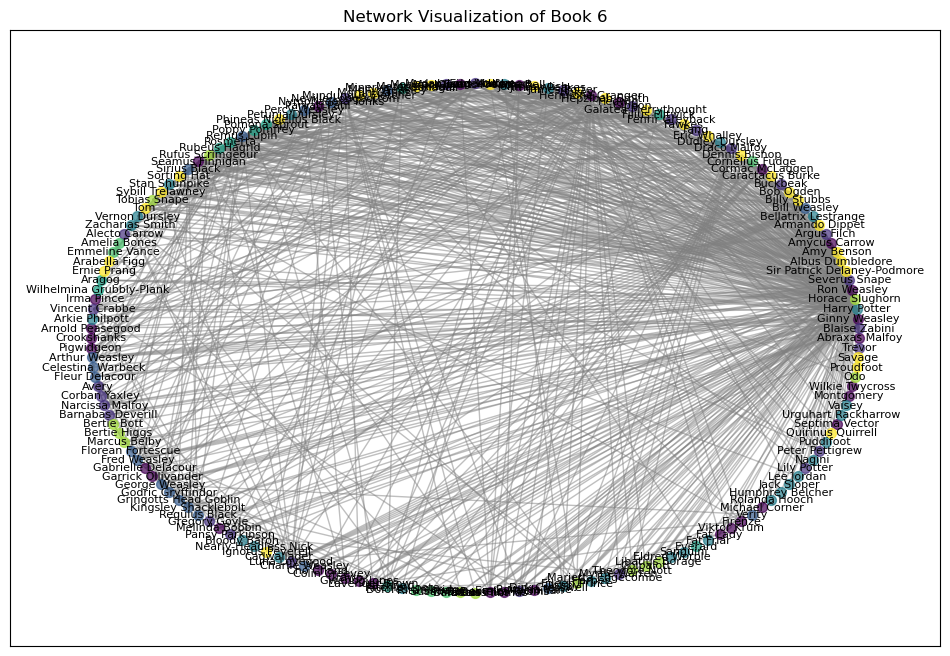

Book 7
Graph with 169 nodes and 955 edges
Number of detected communities: 9
Community 0:  ['Aberforth Dumbledore', 'Albus Dumbledore', 'Ariana Dumbledore', 'Bathilda Bagshot', 'Elphias Doge', 'Enid Smeek', 'Gellert Grindelwald', 'Godric Gryffindor', 'Ivor Dillonsby', 'Kendra Dumbledore', 'Muriel', 'Percival Dumbledore', 'Rita Skeeter', 'Adalbert Waffling', 'Nicolas Flamel', 'Armando Dippet', 'Betty Braithwaite', 'Sybill Trelawney', 'Viktor Krum', 'Lancelot', 'Bowman Wright', 'Mykew Gregorovitch']
Community 1:  ['Ron Weasley', 'Beedle the Bard', 'Ignotus Peverell', 'Marvolo Gaunt', 'Xenophilius Lovegood', 'Alfred Cattermole', 'Ellie Cattermole', 'Maisie Cattermole', 'Antioch Peverell', 'Cadmus Peverell', 'Barny Weasley', 'Bernie', 'Caractacus Burke', 'Celestina Warbeck', 'Fabian Prewett', 'Merlin', 'Nagini', 'Pigwidgeon', 'Stan Shunpike', 'Wakanda', 'Scorpius Malfoy', 'Ulick Gamp']
Community 2:  ['Fred Weasley', 'George Weasley', 'Percy Weasley', 'Alastor Moody', 'Bill Weasley', 'Fleur 

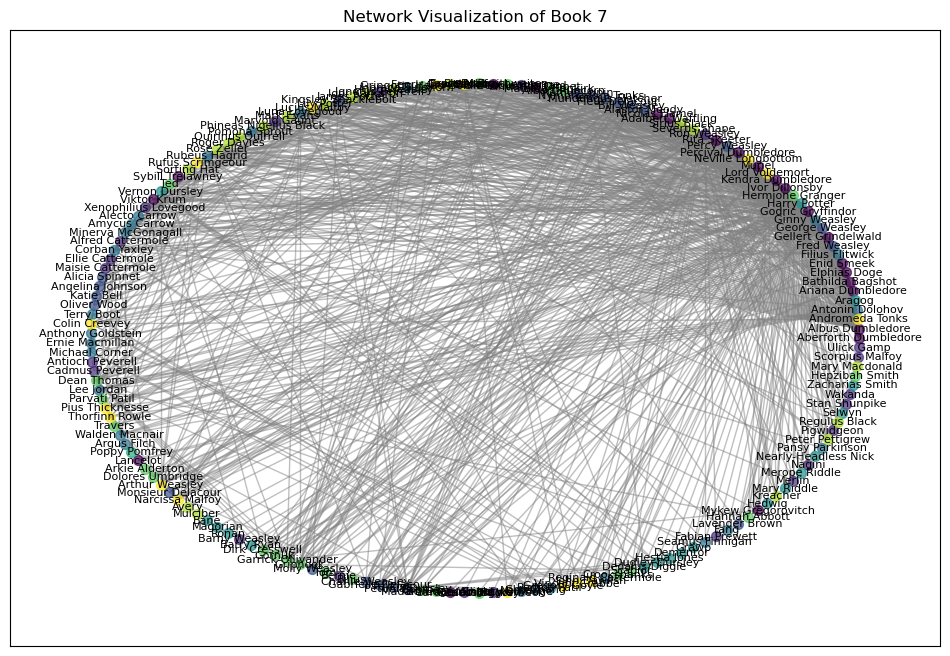

In [261]:
# For each graph compute the partition and modularity, visualize the communities
list_of_com = []
for i, graph in enumerate(graphs):
    list_of_com.append(compute_draw_partition(graph, i + 1))

Here we present a visual representation of the communites. Leveraging the power of the NetworkX library, this Python function enables the visualization of character interactions. By utilizing the Kamada-Kawai layout algorithm, nodes in the network are strategically positioned, providing an intuitive representation of the relationships between characters. The distinct communities within the graph are color-coded, allowing for a clear identification of social clusters.

In [262]:
# Function to reorganize the data into the required format
def reorganize_data(character_to_community):
    community_to_characters = {}
    for character, community in character_to_community.items():
        if community not in community_to_characters:
            community_to_characters[community] = []
        community_to_characters[community].append(character)
    organized_data = {"Book": [community for community in community_to_characters.values()]}
    return organized_data


In [263]:
def calculate_affiliation_percentages(communities, characters_data):
    affiliation_results = {}
    
    for book, communities in communities.items():
        book_results = []
        
        for community in communities:
            if not community:
                continue
            
            affiliations = characters_data[characters_data['name'].isin(community)][['da', 'oof', 'de']].notna().sum() * 100 / len(community)
            
            unknown_percent = 100 - affiliations.sum()

            book_results.append({
                "Community": community,
                "DA_Percentage": affiliations['da'],
                "OoP_Percentage": affiliations['oof'],
                "DE_Percentage": affiliations['de'],
                "Unknown_Percentage": unknown_percent
            })
        
        affiliation_results[book] = book_results
    
    return affiliation_results


In [264]:
# Function to calculate percentages for various attributes
def calculate_percentages(attribute, communities, characters_data):
    results = {}
    for book, communities in communities.items():
        book_results = []
        for community in communities:
            community_size = len(community)
            if community_size == 0:
                continue
            attribute_values = characters_data[characters_data['name'].isin(community)][attribute].value_counts(normalize=True) * 100
            book_results.append({
                "Community": community,
                "Attribute_Percentages": attribute_values
            })
        results[book] = book_results
    return results


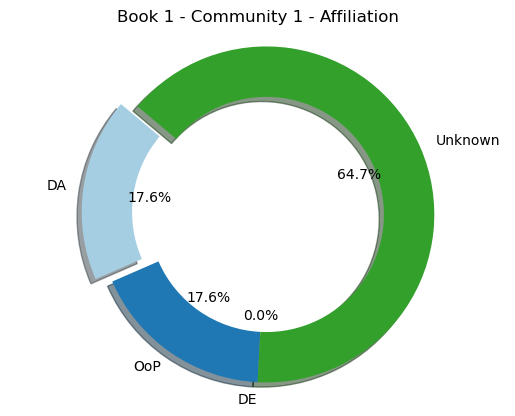

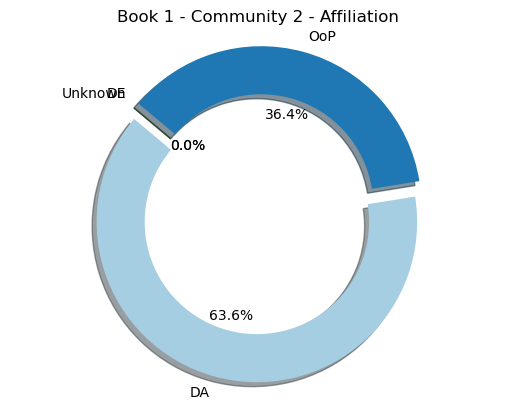

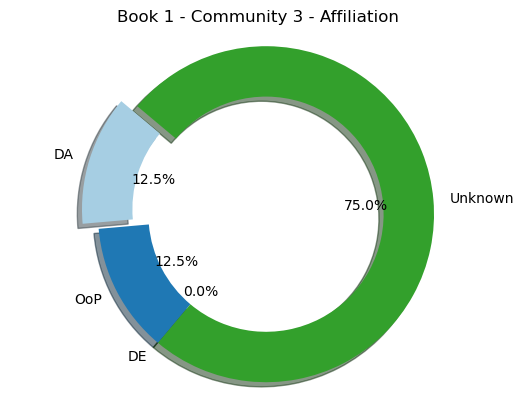

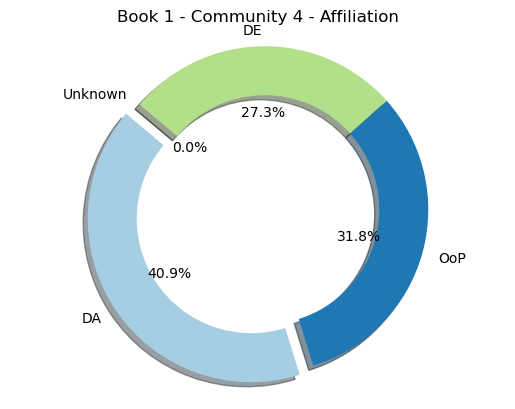

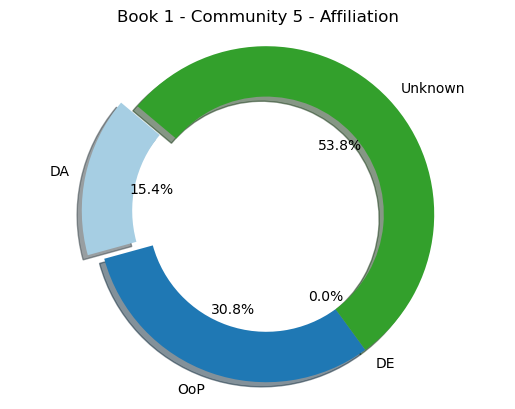

...

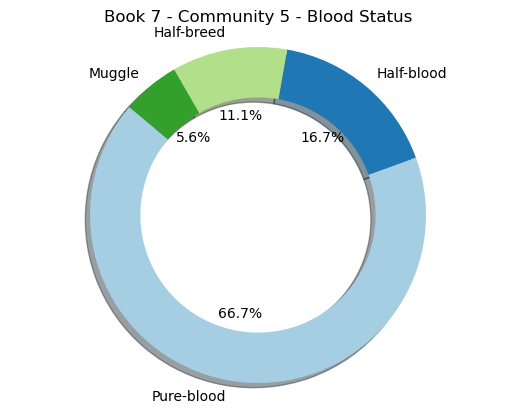

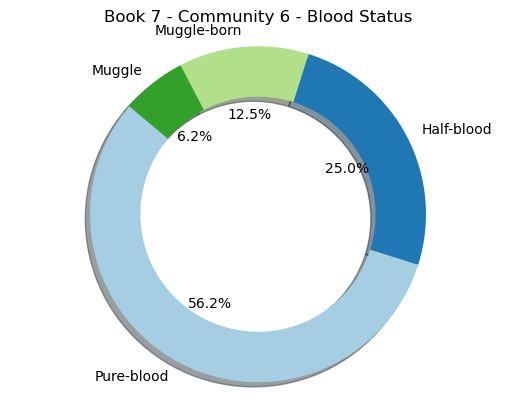

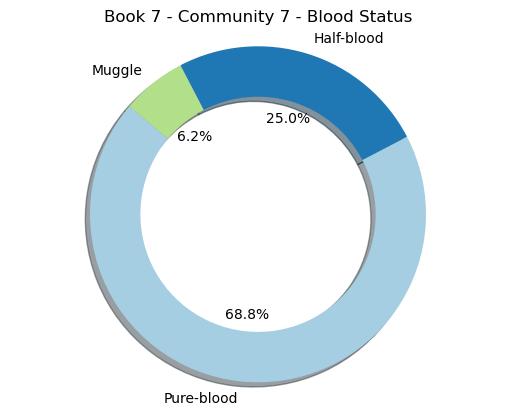

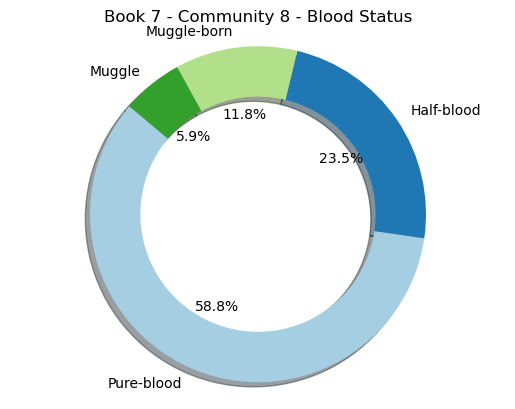

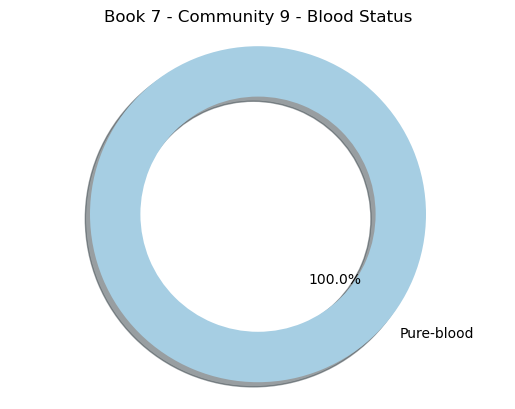

In [265]:
for book_index, com in enumerate(list_of_co):
    # Reorganize the data
    organized_communities = reorganize_data(com)
    
    # Calculate the affiliation percentages
    affiliation_percentages = calculate_affiliation_percentages(organized_communities, characters_df)
    
    for book, results in affiliation_percentages.items():
        for community_index, community_result in enumerate(results, start=1):
            # Calculate sizes with negative values set to zero
            sizes = [max(0, community_result['DA_Percentage']), max(0, community_result['OoP_Percentage']),
                     max(0, community_result['DE_Percentage']), max(0, community_result['Unknown_Percentage'])]

            # Define labels, colors, and explode
            labels = ['DA', 'OoP', 'DE', 'Unknown']
            colors = plt.cm.Paired.colors[:len(labels)]  # Change the color map
            explode = (0.1, 0, 0, 0)  # Explode the 1st slice (DA)

            # Create a pie chart with a custom background color
            fig, ax = plt.subplots()
            ax.set_facecolor('#F5F5F5')  # Light grey background
            plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140, wedgeprops=dict(width=0.3))

            plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
            plt.title(f"Book {book_index + 1} - Community {community_index} - Affiliation")

            # Save or display the pie chart
            file_name = f"book_{book_index + 1}_community_{community_index}_affiliation_pie.png"
            plt.savefig(file_name, bbox_inches='tight', facecolor=fig.get_facecolor())
            plt.show()

        # Calculate and plot percentages for house
        house_percentages = calculate_percentages('house', organized_communities, characters_df)
        
        for community_index, house_result in enumerate(house_percentages[book], start=1):
            sizes = house_result['Attribute_Percentages'].values
            labels = house_result['Attribute_Percentages'].index
            colors = plt.cm.Paired.colors[:len(labels)]

            # Create a pie chart with a custom background color
            fig, ax = plt.subplots()
            ax.set_facecolor('#F5F5F5')  # Light grey background
            plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140, wedgeprops=dict(width=0.3))

            plt.axis('equal')
            plt.title(f"Book {book_index + 1} - Community {community_index} - House")

            file_name = f"book_{book_index + 1}_community_{community_index}_house_pie.png"
            plt.savefig(file_name, bbox_inches='tight', facecolor=fig.get_facecolor())
            plt.show()

        # Calculate and plot percentages for blood_status
        blood_status_percentages = calculate_percentages('blood_status', organized_communities, characters_df)
        
        for community_index, blood_status_result in enumerate(blood_status_percentages[book], start=1):
            sizes = blood_status_result['Attribute_Percentages'].values
            labels = blood_status_result['Attribute_Percentages'].index
            colors = plt.cm.Paired.colors[:len(labels)]

            # Create a pie chart with a custom background color
            fig, ax = plt.subplots()
            ax.set_facecolor('#F5F5F5')  # Light grey background
            plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140, wedgeprops=dict(width=0.3))

            plt.axis('equal')
            plt.title(f"Book {book_index + 1} - Community {community_index} - Blood Status")

            file_name = f"book_{book_index + 1}_community_{community_index}_blood_status_pie.png"
            plt.savefig(file_name, bbox_inches='tight', facecolor=fig.get_facecolor())
            plt.show()


Within the visual exploration of each community, a trilogy of pie charts unveils key insights into the intricate social fabric of the Harry Potter universe. The first pie chart give information on the affiliations of characters within the community, portraying the percentages of characters aligned with distinct factions such as the Death Eaters, Order of the Phoenix, and others. The second pie chart gives data on the distribution of houses within the community, offering a snapshot of the percentage representation of Gryffindor, Slytherin, Hufflepuff, and Ravenclaw. Finally, the third pie chart unravels the composition of blood statuses, showcasing the proportions of characters classified as gaint, half-blood, half-breed, muggle, muggle-born, pure-blood, squib, and those with unknown blood statuses.

- In Book 1 
    - Community 2:
        - This community revolves around characters associated with Quidditch and related events. 
        - All characters in this community are either Quidditch players or have a direct association with the sport
        - Most of the character are in the Dambledor's army with 58,3%, the majority of the characters are from Gryffindor with 77,8% and all of them are pure-blood as we expected
- In Book 3 
    - Community 0:
        - There are characters represent various Hogwarts staff members, including professors, caretakers, and magical creatures' caretakers.
        - The inclusion of magical creatures suggests a theme related to creatures residing at or associated with Hogwarts.
        - The presence of Lord Voldemort and Sirius Black indicates the inclusion of significant wizarding figures with key roles in the overall narrative. Merlin, James Potter and Lily Potter a legendary wizard, adds a historical dimension.
        - Most of the character are not in any affiliation with 80%. The surprise is that everyone is from Gryffindor and everyone is pure blood as well.
        

In the initial three books, the community dynamics revolve around Hogwarts students, staff and general characters, aligning with the series' central focus. As expected, Death Eaters and Voldemort's associates are notably absent from these early communities, reflecting the narrative timeline. These insights offer a glimpse into the everyday interactions within Hogwarts. A delightful revelation unfolds as each book introduces a unique community dedicated to Quidditch players, emphasizing the significance of the magical sport. 

- In Book 4 
    - Community 5:
        - There are characters are known Death Eaters or individuals associated with dark magic. Their allegiance to Lord Voldemort suggests a shared theme of serving the dark forces.
        - This community includes significant characters directly connected to Voldemort. Nagini, Voldemort's snake and Horcrux, and Peter Pettigrew, who played a crucial role in Voldemort's return, further emphasize the close ties within Voldemort's inner circle.
        - The presence of characters associated with Voldemort's return, his followers, and those affected by his actions creates a thematic link to the overarching Voldemort storyline. The legacy of Voldemort and the impact on the wizarding world are central themes within this community.
        - No one is in Dumbledor's army neither in order of the phoenix, and most of them are in Slytherin.
- In Book 5 
    - Community 0:
        - This community includes a diverse set of characters representing significant figures in the wizarding world. The theme centers around their roles in shaping events, alliances, and conflicts.
        - Characters associated with the Ministry of Magic are prominent in this community. The theme revolves around political dynamics, government roles, and the influence of the Ministry in the wizarding society.
        - The presence of known Death Eaters and followers of Lord Voldemort suggests a connection to dark forces and the overarching conflict between good and evil.
        - It is the biggest community, so we can not understand a lot of things from the piecharts.
        - This when the wizzarding world learns about the return of the Voldemord, so we can understand why there are a lot of big communities. More people equals more interactions

-----------------------------------